## Setting

In [1]:
import pandas as pd
import numpy as np

from lightgbm import LGBMRegressor
from sklearn.model_selection import KFold

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots

import warnings
warnings.filterwarnings(action='ignore')

FONT_COLOR = "#545454"
BACKGROUND_COLOR = "#FFFCFA"

In [2]:
#data_path = '/content/drive/MyDrive/DS/CO2/data/'

train = pd.read_csv('train.csv')
test = pd.read_csv('test.csv')
submission = pd.read_csv('sample_submission.csv')
country_df = pd.read_csv('country.csv')

train.shape, test.shape, submission.shape, country_df.shape

((79023, 76), (24353, 75), (24353, 2), (497, 3))

In [3]:
train.head()

,ID_LAT_LON_YEAR_WEEK,latitude,longitude,year,week_no,SulphurDioxide_SO2_column_number_density,SulphurDioxide_SO2_column_number_density_amf,SulphurDioxide_SO2_slant_column_number_density,SulphurDioxide_cloud_fraction,SulphurDioxide_sensor_azimuth_angle,...,Cloud_cloud_top_height,Cloud_cloud_base_pressure,Cloud_cloud_base_height,Cloud_cloud_optical_depth,Cloud_surface_albedo,Cloud_sensor_azimuth_angle,Cloud_sensor_zenith_angle,Cloud_solar_azimuth_angle,Cloud_solar_zenith_angle,emission
0,ID_-0.510_29.290_2019_00,-0.51,29.29,2019,0,-0.000108,0.603019,-0.000065,0.255668,-98.593887,...,3664.436218,61085.809570,2615.120483,15.568533,0.272292,-12.628986,35.632416,-138.786423,30.752140,3.750994
1,ID_-0.510_29.290_2019_01,-0.51,29.29,2019,1,0.000021,0.728214,0.000014,0.130988,16.592861,...,3651.190311,66969.478735,3174.572424,8.690601,0.256830,30.359375,39.557633,-145.183930,27.251779,4.025176
2,ID_-0.510_29.290_2019_02,-0.51,29.29,2019,2,0.000514,0.748199,0.000385,0.110018,72.795837,...,4216.986492,60068.894448,3516.282669,21.103410,0.251101,15.377883,30.401823,-142.519545,26.193296,4.231381
3,ID_-0.510_29.290_2019_03,-0.51,29.29,2019,3,NaN,NaN,NaN,NaN,NaN,...,5228.507736,51064.547339,4180.973322,15.386899,0.262043,-11.293399,24.380357,-132.665828,28.829155,4.305286
4,ID_-0.510_29.290_2019_04,-0.51,29.29,2019,4,-0.000079,0.676296,-0.000048,0.121164,4.121269,...,3980.598120,63751.125781,3355.710107,8.114694,0.235847,38.532263,37.392979,-141.509805,22.204612,4.347317


In [4]:
submission.head()

,ID_LAT_LON_YEAR_WEEK,emission
0,ID_-0.510_29.290_2022_00,81.94
1,ID_-0.510_29.290_2022_01,81.94
2,ID_-0.510_29.290_2022_02,81.94
3,ID_-0.510_29.290_2022_03,81.94
4,ID_-0.510_29.290_2022_04,81.94


In [5]:
all = pd.concat([train, test]).reset_index(drop=True)

fts = ['ID_LAT_LON_YEAR_WEEK', 'latitude', 'longitude', 'year', 'week_no', 'emission']
all = all[fts]

all

,ID_LAT_LON_YEAR_WEEK,latitude,longitude,year,week_no,emission
0,ID_-0.510_29.290_2019_00,-0.510,29.290,2019,0,3.750994
1,ID_-0.510_29.290_2019_01,-0.510,29.290,2019,1,4.025176
2,ID_-0.510_29.290_2019_02,-0.510,29.290,2019,2,4.231381
3,ID_-0.510_29.290_2019_03,-0.510,29.290,2019,3,4.305286
4,ID_-0.510_29.290_2019_04,-0.510,29.290,2019,4,4.347317
...,...,...,...,...,...,...
103371,ID_-3.299_30.301_2022_44,-3.299,30.301,2022,44,NaN
103372,ID_-3.299_30.301_2022_45,-3.299,30.301,2022,45,NaN
103373,ID_-3.299_30.301_2022_46,-3.299,30.301,2022,46,NaN
103374,ID_-3.299_30.301_2022_47,-3.299,30.301,2022,47,NaN


## EDA

### emission

In [6]:
train.emission.describe()

count    79023.000000
mean        81.940552
std        144.299648
min          0.000000
25%          9.797995
50%         45.593445
75%        109.549595
max       3167.768000
Name: emission, dtype: float64

In [7]:
df = train.groupby(['latitude', 'longitude']).emission.mean().sort_values().reset_index()
df

,latitude,longitude,emission
0,-1.682,29.218,0.000000
1,-2.859,29.041,0.000000
2,-1.833,28.467,0.000000
3,-2.841,29.159,0.000000
4,-1.974,28.526,0.000000
...,...,...,...
492,-1.342,31.358,409.606870
493,-0.956,30.744,455.398039
494,-1.346,31.254,475.289138
495,-2.079,29.321,1221.886518


In [8]:
df.emission.describe()

count     497.000000
mean       81.940552
std       137.357720
min         0.000000
25%        10.900797
50%        46.700873
75%       113.135679
max      2233.431628
Name: emission, dtype: float64

In [9]:
df[df.emission<0.1]

,latitude,longitude,emission
0,-1.682,29.218,0.000000
1,-2.859,29.041,0.000000
2,-1.833,28.467,0.000000
3,-2.841,29.159,0.000000
4,-1.974,28.526,0.000000
5,-1.730,28.470,0.000000
6,-1.712,28.688,0.000000
7,-1.696,28.304,0.000000
8,-2.817,29.283,0.000000
9,-1.839,28.761,0.000000


In [10]:
df[df.emission>300]

,latitude,longitude,emission
480,-1.048,30.252,302.324454
481,-2.300,29.200,305.690542
482,-2.376,29.924,308.460022
483,-1.641,31.259,308.698319
484,-1.486,29.614,312.098334
485,-1.187,31.113,318.536348
486,-1.115,30.085,321.410481
487,-1.889,29.611,324.808862
488,-2.293,29.507,336.199968
489,-1.847,30.953,347.017595


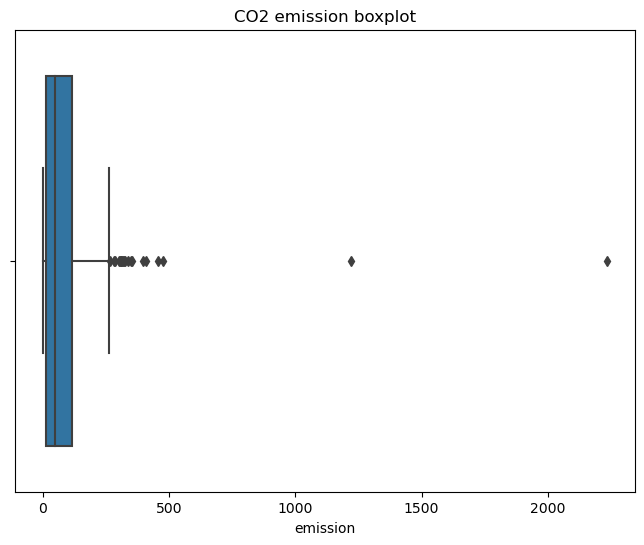

In [11]:
plt.figure(figsize=(8,6))
plt.title('CO2 emission boxplot')
sns.boxplot(df.emission)
plt.show()

In [12]:
# fig = go.Figure(go.Histogram(
#     x=train.emission,
#     marker_color='seagreen'))

# fig.update_layout(
#     title_text="CO2 Emission Distributions",
#     template='plotly_dark')

# fig.show()

In [13]:
# fig = go.Figure(go.Histogram(
#     x=np.log(train.emission),
#     marker_color='seagreen'))

# fig.update_layout(
#     title_text="CO2 Emission Distributions",
#     template='plotly_dark')

# fig.show()

### latitude & longitude

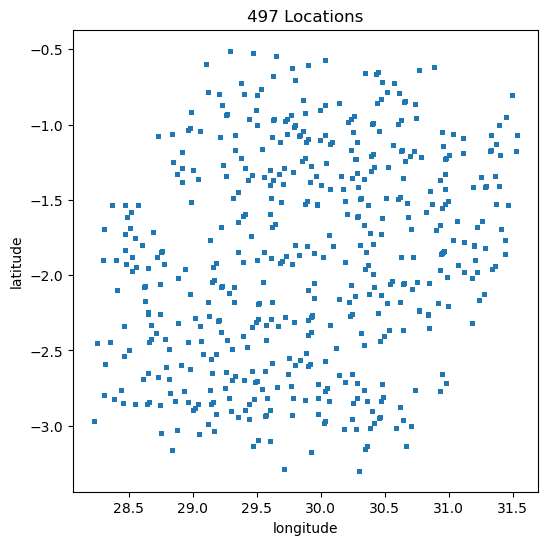

In [14]:
plt.figure(figsize=(6,6))
plt.title("497 Locations")
plt.scatter(train.longitude, train.latitude, s=5)
plt.xlabel('longitude')
plt.ylabel('latitude')
plt.show()

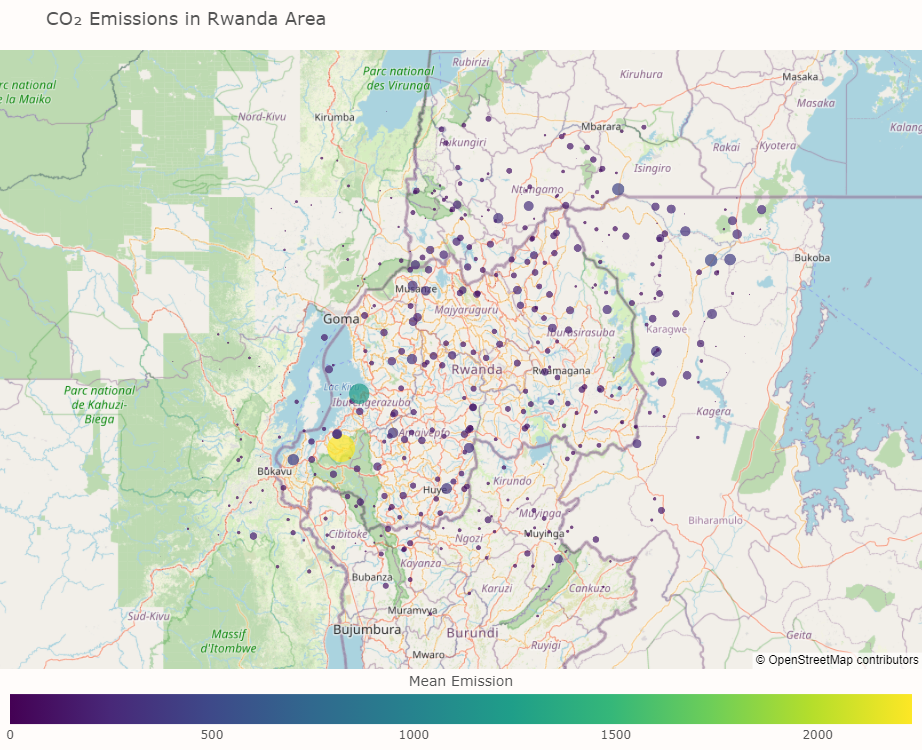

In [90]:
emission_df = train.groupby(['latitude', 'longitude']).emission.mean().reset_index()

fig = px.scatter_mapbox(emission_df,
    lat="latitude",
    lon="longitude",
    color="emission",
    size="emission",
    color_continuous_scale='Viridis',
    size_max=20,
    zoom=7,
    width=750,
    height=750,
    title="CO\u2082 Emissions in Rwanda Area"
)

fig.update_layout(
    mapbox_style="open-street-map",
    margin=dict(r=0, t=50, l=0, b=0),
    font_color=FONT_COLOR,
    title_font_size=18,
    coloraxis_colorbar=dict(
        title="Mean Emission",
        title_side="top",
        orientation="h",
        yanchor="bottom",
        xanchor="center",
        y=-0.13,
        x=0.5,
    ),
    plot_bgcolor=BACKGROUND_COLOR,
    paper_bgcolor=BACKGROUND_COLOR,
)
fig.show()

In [16]:
# geo_mean_emission = train.groupby(['latitude', 'longitude']).emission.mean().reset_index()
# zero_emission = geo_mean_emission[geo_mean_emission.emission == 0]

# fig = px.scatter_mapbox(geo_mean_emission,
#     lat="latitude",
#     lon="longitude",
#     color="emission",
#     size="emission",
#     color_continuous_scale='Cividis',
#     size_max=30,
#     zoom=7,
#     width=800,
#     height=600,
#     title="CO\u2082 emission in Rwanda"
# )

# fig.add_scattermapbox(
#     lat=zero_emission.latitude,
#     lon=zero_emission.longitude,
#     name="Zero-Emission",
#     marker=dict(color="#E04C5F", size=15, symbol="circle", opacity=0.75),
# )
# fig.update_layout(
#     mapbox_style="open-street-map",
#     margin=dict(r=0, t=90, l=0, b=0),
#     font_color=FONT_COLOR,
#     title_font_size=18,
#     coloraxis_colorbar=dict(
#         title="Mean Emission",
#         title_side="top",
#         orientation="h",
#         yanchor="bottom",
#         xanchor="center",
#         y=-0.13,
#         x=0.5,
#     ),
#     legend=dict(yanchor="bottom", xanchor="right", y=1, x=1, orientation="h"),
#     plot_bgcolor=BACKGROUND_COLOR,
#     paper_bgcolor=BACKGROUND_COLOR,
# )
# fig.show()

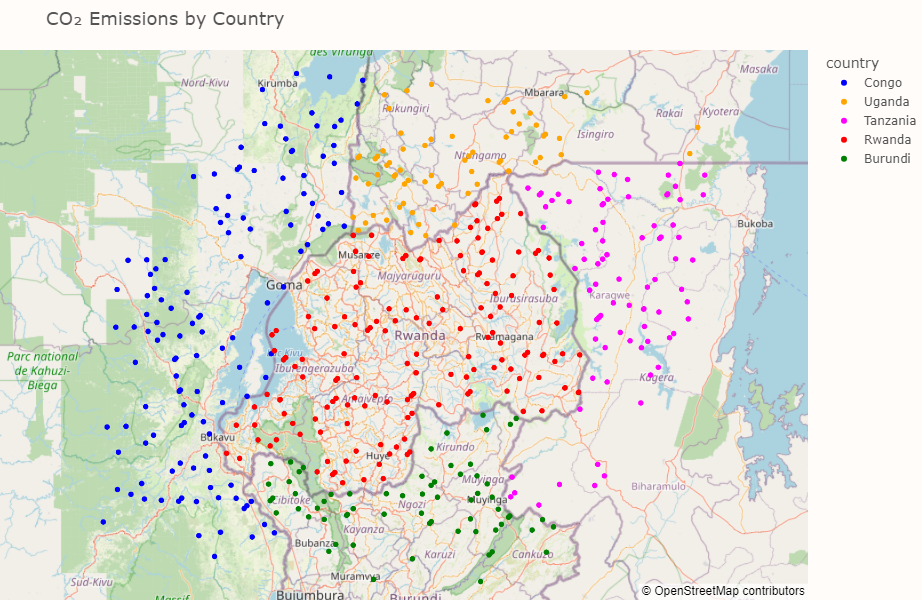

In [17]:
marker_df = country_df.copy()

fig = px.scatter_mapbox(marker_df,
    lat="latitude",
    lon="longitude",
    color="country",
    color_discrete_map={'Rwanda': 'red', 'Uganda': 'orange',
                        'Tanzania': 'magenta', 'Burundi': 'green', 'Congo': 'blue'},
    hover_name="country",
    zoom=7,
    title="CO\u2082 Emissions by Country")

fig.update_layout(
    mapbox_style = "open-street-map",
    margin=dict(r=0, t=50, l=0, b=0),
    font_color=FONT_COLOR,
    title_font_size=18,
    mapbox_center={"lat": marker_df["latitude"].mean(), "lon": marker_df["longitude"].mean()},
    width=600,
    height=600,
    plot_bgcolor=BACKGROUND_COLOR,
    paper_bgcolor=BACKGROUND_COLOR
)
fig.show()

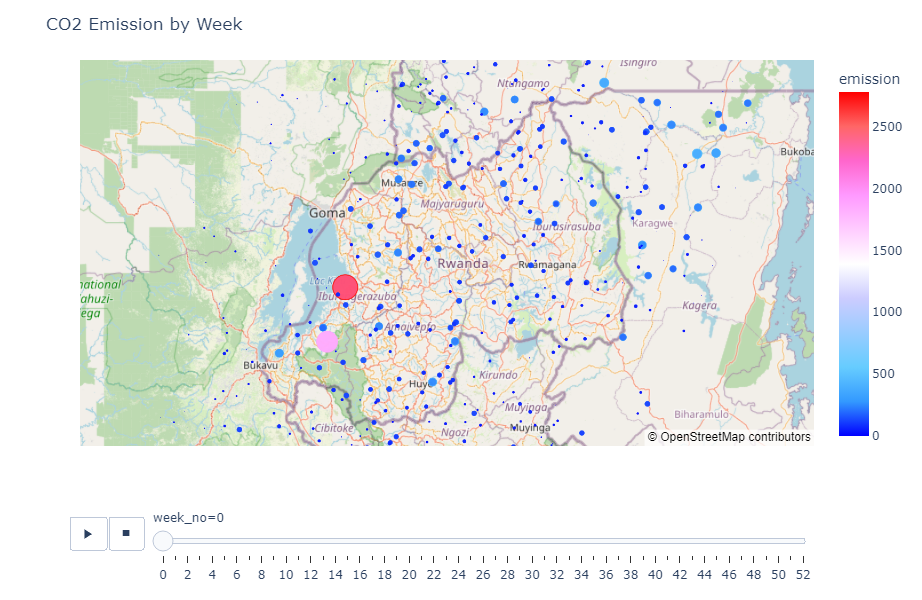

In [18]:
fig = px.scatter_mapbox(
    train, lat='latitude', lon='longitude',
    size='emission',
    color='emission',
    color_continuous_scale='Picnic',
    animation_frame = 'week_no',
    zoom=7)

fig.update_layout(
    title='CO2 Emission by Week',
    mapbox_style = "open-street-map",
    width=800,
    height=600)

fig.show()

### year & week_no

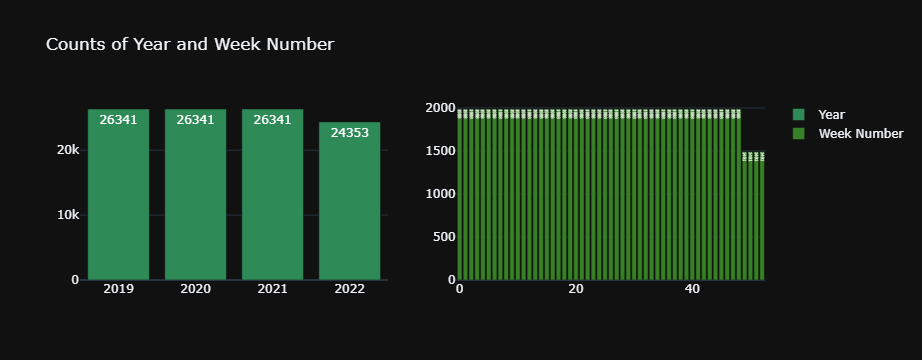

In [19]:
fig = make_subplots(rows=1, cols=2)

year_cnt = all.year.value_counts()
week_cnt = all.week_no.value_counts()

fig.add_trace(go.Bar(
    x=year_cnt.index,
    y=year_cnt.values,
    text=year_cnt.values,
    name='Year',
    marker_color='seagreen'),
    row=1, col=1)

fig.add_trace(go.Bar(
    x=week_cnt.index,
    y=week_cnt.values,
    text=week_cnt.values,
    name='Week Number',
    marker_color='#378025'),
    row=1, col=2)

fig.update_layout(
    title='Counts of Year and Week Number',
    template='plotly_dark')

fig.show()

In [20]:
# plt.figure(figsize=(10,5))
# plt.title('Emission over Week')
# sns.lineplot(x='week_no', y='emission', data=train, errorbar=None)
# plt.show()

In [21]:
# year_week = pd.to_datetime((train.year * 100 + train.week_no).astype('str') + '0', format='%Y%W%w')

# plt.figure(figsize=(10,5))
# plt.title('Emission over Time')
# sns.lineplot(x=year_week, y='emission', data=train, errorbar=None)

# plt.show()

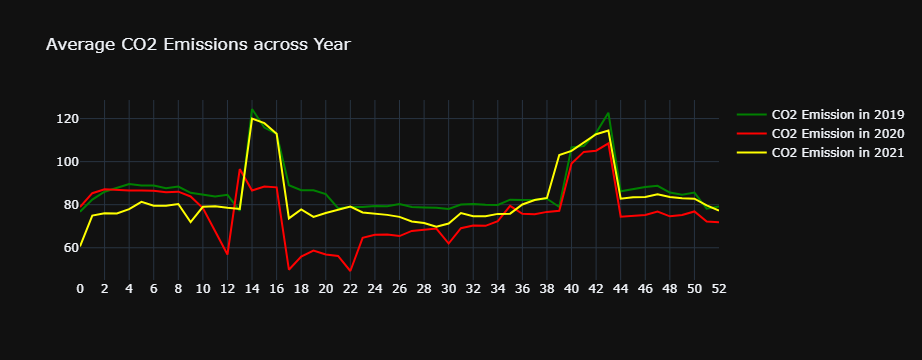

In [22]:
fig = go.Figure()

emission_by_time = train.groupby(['year', 'week_no']).emission.mean()

fig.add_trace(go.Scatter(
    x=emission_by_time.loc[2019].index.astype('str'),
    y=emission_by_time.loc[2019],
    mode='lines',
    name='CO2 Emission in 2019',
    line=dict(color='Green')))

fig.add_trace(go.Scatter(
    x=emission_by_time.loc[2020].index.astype('str'),
    y=emission_by_time.loc[2020],
    mode='lines',
    name='CO2 Emission in 2020',
    line=dict(color='Red')))

fig.add_trace(go.Scatter(
    x=emission_by_time.loc[2021].index.astype('str'),
    y=emission_by_time.loc[2021],
    mode='lines',
    name='CO2 Emission in 2021',
    line=dict(color='Yellow')))

fig.update_layout(
    title_text='Average CO2 Emissions across Year',
    template='plotly_dark')

fig.show()

In [23]:
# plt.figure(figsize=(10, 5))
# plt.title('Time series for every location')

# unique_locations = train[['latitude', 'longitude']].drop_duplicates()
# for _, ll in unique_locations.iterrows():
#     val = train[(train.latitude==ll.latitude) & (train.longitude==ll.longitude)].emission
#     sns.lineplot(x=range(len(val)), y=val)
# for week in [0, 53, 106, 159]:
#     plt.axvline(week, color='k', linestyle='--')

# plt.xlabel('week')
# plt.ylabel('emission')
# plt.show()

In [24]:
# plt.figure(figsize=(10, 5))
# plt.title('Time series for every location')

# excluded = [
#     {'latitude': -2.378, 'longitude': 29.222},
#     {'latitude': -2.079, 'longitude': 29.321}
# ]

# unique_locations = train[['latitude', 'longitude']].drop_duplicates()
# for _, ll in unique_locations.iterrows():
#     if {'latitude': ll.latitude, 'longitude': ll.longitude} not in excluded:
#         val = train[(train.latitude==ll.latitude) & (train.longitude==ll.longitude)].emission
#         sns.lineplot(x=range(len(val)), y=val)
# for week in [0, 53, 106, 159]:
#     plt.axvline(week, color='k', linestyle='--')

# plt.xlabel('week')
# plt.ylabel('emission')
# plt.show()

## Features

### month, weekth

In [25]:
# all['month'] = pd.to_datetime((all.year * 100 + all.week_no).astype('str') + '0', format='%Y%W%w').dt.month
# all.loc[all.week_no==52, 'month'] = 12

In [26]:
all['weekth'] = (all.year-2019) * 53 + all.week_no

### country

In [27]:
all = all.merge(country_df, on=['latitude', 'longitude'], how='left')
all.country = all.country.astype('category')
all

,ID_LAT_LON_YEAR_WEEK,latitude,longitude,year,week_no,emission,weekth,country
0,ID_-0.510_29.290_2019_00,-0.510,29.290,2019,0,3.750994,0,Congo
1,ID_-0.510_29.290_2019_01,-0.510,29.290,2019,1,4.025176,1,Congo
2,ID_-0.510_29.290_2019_02,-0.510,29.290,2019,2,4.231381,2,Congo
3,ID_-0.510_29.290_2019_03,-0.510,29.290,2019,3,4.305286,3,Congo
4,ID_-0.510_29.290_2019_04,-0.510,29.290,2019,4,4.347317,4,Congo
...,...,...,...,...,...,...,...,...
103371,ID_-3.299_30.301_2022_44,-3.299,30.301,2022,44,NaN,203,Burundi
103372,ID_-3.299_30.301_2022_45,-3.299,30.301,2022,45,NaN,204,Burundi
103373,ID_-3.299_30.301_2022_46,-3.299,30.301,2022,46,NaN,205,Burundi
103374,ID_-3.299_30.301_2022_47,-3.299,30.301,2022,47,NaN,206,Burundi


In [28]:
all.groupby('country').emission.mean().sort_values()

country
Congo        14.882282
Burundi      50.027305
Tanzania     88.485920
Uganda       92.363124
Rwanda      139.004677
Name: emission, dtype: float64

### loc_group

In [29]:
all['loc_group'] = 'Normal'

all.loc[(all.latitude==-2.079) & (all.longitude==29.321), 'loc_group'] = 'Power'
all.loc[(all.latitude==-2.378) & (all.longitude==29.222), 'loc_group'] = 'Coffee'

In [30]:
df = train.groupby(['latitude', 'longitude']).emission.sum().reset_index()
ems0_df = df[df.emission==0]
ems0_df

,latitude,longitude,emission
38,-2.898,29.002,0.0
43,-2.859,29.041,0.0
52,-2.841,29.159,0.0
62,-2.817,29.283,0.0
118,-2.496,28.504,0.0
224,-1.974,28.526,0.0
264,-1.839,28.761,0.0
266,-1.833,28.467,0.0
283,-1.730,28.470,0.0
286,-1.712,28.688,0.0


In [31]:
mask = all.latitude.isin(ems0_df.latitude) & all.longitude.isin(ems0_df.longitude)
all.loc[mask, 'loc_group'] = 'EMS_0'

all[all.loc_group=='EMS_0']

,ID_LAT_LON_YEAR_WEEK,latitude,longitude,year,week_no,emission,weekth,country,loc_group
20511,ID_-1.328_28.872_2019_00,-1.328,28.872,2019,0,0.0,0,Congo,EMS_0
20512,ID_-1.328_28.872_2019_01,-1.328,28.872,2019,1,0.0,1,Congo,EMS_0
20513,ID_-1.328_28.872_2019_02,-1.328,28.872,2019,2,0.0,2,Congo,EMS_0
20514,ID_-1.328_28.872_2019_03,-1.328,28.872,2019,3,0.0,3,Congo,EMS_0
20515,ID_-1.328_28.872_2019_04,-1.328,28.872,2019,4,0.0,4,Congo,EMS_0
...,...,...,...,...,...,...,...,...,...
101509,ID_-2.898_29.002_2022_44,-2.898,29.002,2022,44,NaN,203,Congo,EMS_0
101510,ID_-2.898_29.002_2022_45,-2.898,29.002,2022,45,NaN,204,Congo,EMS_0
101511,ID_-2.898_29.002_2022_46,-2.898,29.002,2022,46,NaN,205,Congo,EMS_0
101512,ID_-2.898_29.002_2022_47,-2.898,29.002,2022,47,NaN,206,Congo,EMS_0


### emission

In [32]:
df = train.groupby(['latitude', 'longitude'])['emission'].mean().reset_index()
df.columns = ['latitude', 'longitude', 'loc_avg_all']
all = pd.merge(all, df, on=['latitude', 'longitude'], how='left')

df
#all

,latitude,longitude,loc_avg_all
0,-3.299,30.301,27.633301
1,-3.287,29.713,42.077684
2,-3.174,29.926,44.832340
3,-3.161,28.839,0.125809
4,-3.153,30.347,14.502592
...,...,...,...
492,-0.598,29.102,0.090357
493,-0.569,30.031,116.187763
494,-0.547,29.653,0.589954
495,-0.528,29.472,4.183500


In [33]:
df = train.groupby(['latitude', 'longitude', 'week_no'])['emission'].max().reset_index()
df.columns = ['latitude', 'longitude', 'week_no', 'loc_max_week']
all = pd.merge(all, df, on=['latitude', 'longitude', 'week_no'], how='left')

df
#all

,latitude,longitude,week_no,loc_max_week
0,-3.299,30.301,0,26.789497
1,-3.299,30.301,1,29.035374
2,-3.299,30.301,2,29.652285
3,-3.299,30.301,3,29.950650
4,-3.299,30.301,4,30.572742
...,...,...,...,...
26336,-0.510,29.290,48,4.736880
26337,-0.510,29.290,49,4.687898
26338,-0.510,29.290,50,4.607418
26339,-0.510,29.290,51,4.470275


In [34]:
# all['loc_prv'] = all.groupby('year')['loc_cur'].shift()
# all['loc_nxt'] = all.groupby('year')['loc_cur'].shift(-1)
# all['loc_max'] = all[['loc_cur', 'loc_prv', 'loc_nxt']].max(axis=1)

# all

### Covid

In [35]:
# df = train.pivot_table(index='week_no', columns='year', values='emission', aggfunc='mean')
# df.columns = ['yr{}'.format(col % 100) for col in df.columns]
# df

In [36]:
# df['cmp19-20'] = (df.yr19 - df.yr20) / df.yr19 * 100
# df['cmp20-21'] = (df.yr20 - df.yr21) / df.yr20 * 100
# df['cmp19-21'] = (df.yr19 - df.yr21) / df.yr19 * 100

# df

In [37]:
# all['is_covid'] = 0
# all.loc[(all.year==2020) & (all.week_no>=10), 'is_covid'] = 1
# all.loc[(all.year==2021) & (all.week_no<=20), 'is_covid'] = 1

## Normal Case (480 Locations)

In [38]:
all_org = all

#all = all[all.loc_group=='Normal']

<AxesSubplot:>

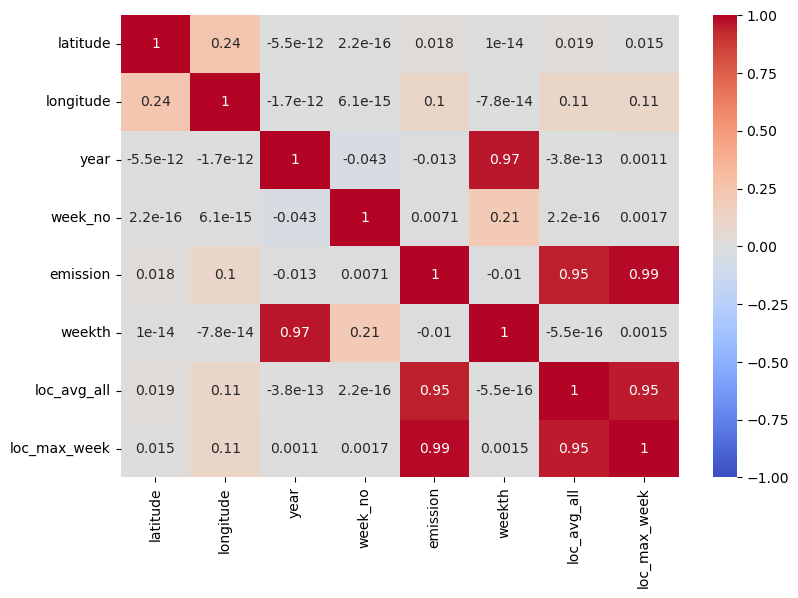

In [39]:
plt.figure(figsize=(9,6))
corr = all.corr()
sns.heatmap(corr, vmax=1, vmin=-1, center=0, annot=True, cmap='coolwarm')

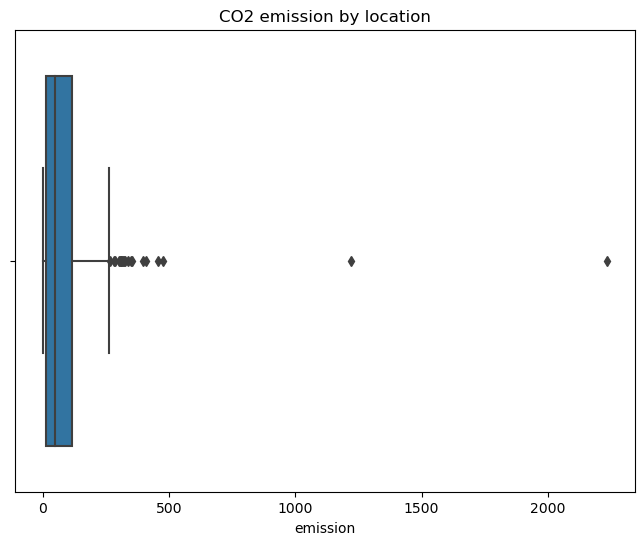

In [40]:
df = all.groupby(['latitude', 'longitude']).emission.mean().reset_index()

plt.figure(figsize=(8,6))
plt.title('CO2 emission by location')
sns.boxplot(df.emission)
plt.show()

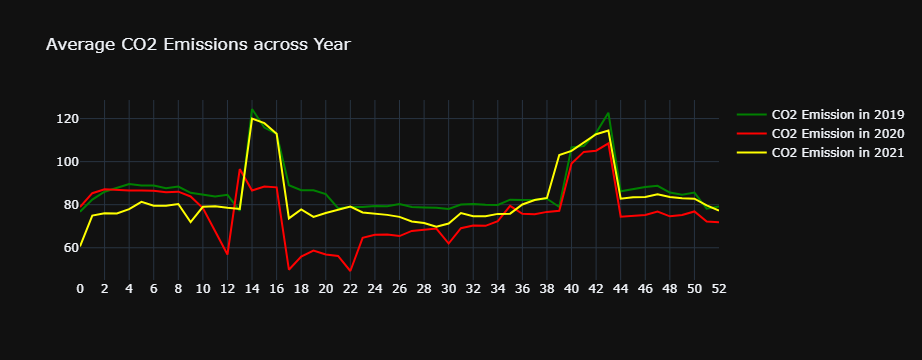

In [41]:
fig = go.Figure()

emission_by_time = all.groupby(['year', 'week_no']).emission.mean()

years = [2019, 2020, 2021]
colors = ['Green', 'Red', 'Yellow']

for year, color in zip(years, colors):
    fig.add_trace(go.Scatter(
        x=emission_by_time.loc[year].index.astype('str'),
        y=emission_by_time.loc[year],
        mode='lines',
        name=f'CO2 Emission in {year}',
        line=dict(color=color)))

fig.update_layout(
    title_text='Average CO2 Emissions across Year',
    template='plotly_dark')

fig.show()

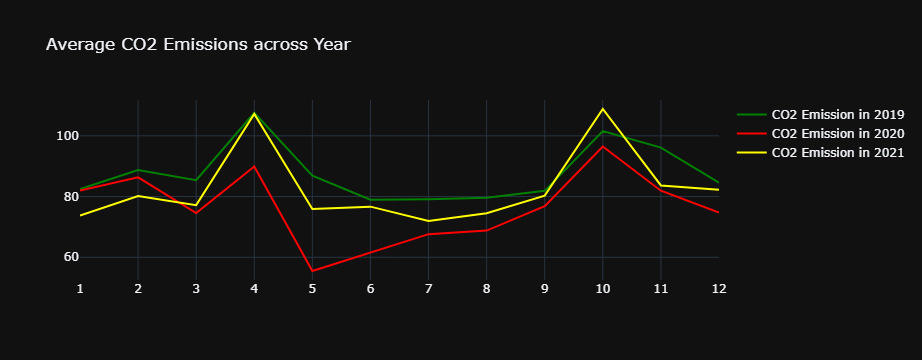

In [42]:
fig = go.Figure()

month = pd.to_datetime((all.year * 100 + all.week_no).astype('str') + '0', format='%Y%W%w').dt.month
emission_by_time = all.groupby(['year', month]).emission.mean()

years = [2019, 2020, 2021]
colors = ['Green', 'Red', 'Yellow']

for year, color in zip(years, colors):
    fig.add_trace(go.Scatter(
        x=emission_by_time.loc[year].index.astype('str'),
        y=emission_by_time.loc[year],
        mode='lines',
        name=f'CO2 Emission in {year}',
        line=dict(color=color)))

fig.update_layout(
    title_text='Average CO2 Emissions across Year',
    template='plotly_dark')

fig.show()

In [43]:
# fig = make_subplots(rows=3, cols=2)

# year_week = pd.to_datetime((train.year * 100 + train.week_no).astype('str') + '0', format='%Y%W%w')
# all_5 = all[all.year<2022].groupby('weekth').emission.mean().reset_index()
# rwanda = all[(all.year<2022) & (all.country=='Rwanda')].groupby('weekth').emission.mean().reset_index()
# uganda = all[(all.year<2022) & (all.country=='Uganda')].groupby('weekth').emission.mean().reset_index()
# tanzania = all[(all.year<2022) & (all.country=='Tanzania')].groupby('weekth').emission.mean().reset_index()
# burundi = all[(all.year<2022) & (all.country=='Burundi')].groupby('weekth').emission.mean().reset_index()
# congo = all[(all.year<2022) & (all.country=='Congo')].groupby('weekth').emission.mean().reset_index()

# fig.add_trace(go.Scatter(
#     x=year_week,
#     y=all_5.emission,
#     mode='lines',
#     name='All Countries',
#     line=dict(color='Yellow')),
#     row=1, col=1)

# fig.add_trace(go.Scatter(
#     x=year_week,
#     y=rwanda.emission,
#     mode='lines',
#     name='Rwanda',
#     line=dict(color='Red')),
#     row=1, col=2)

# fig.add_trace(go.Scatter(
#     x=year_week,
#     y=uganda.emission,
#     mode='lines',
#     name='Uganda',
#     line=dict(color='Orange')),
#     row=2, col=1)

# fig.add_trace(go.Scatter(
#     x=year_week,
#     y=tanzania.emission,
#     mode='lines',
#     name='Tanzania',
#     line=dict(color='Orange')),
#     row=2, col=2)

# fig.add_trace(go.Scatter(
#     x=year_week,
#     y=burundi.emission,
#     mode='lines',
#     name='Burundi',
#     line=dict(color='Green')),
#     row=3, col=1)

# fig.add_trace(go.Scatter(
#     x=year_week,
#     y=congo.emission,
#     mode='lines',
#     name='Congo',
#     line=dict(color='Green')),
#     row=3, col=2)

# fig.update_layout(
#     title='Average CO2 Emissions by Country',
#     template='plotly_dark')

# fig.show()

In [44]:
# fig = go.Figure()

# countries = ['Rwanda', 'Uganda', 'Tanzania', 'Burundi', 'Congo']
# colors = ['Red', 'Orange', 'Magenta', 'Green', 'LimeGreen']

# for i, country in enumerate(countries):
#     # if i==0:
#     #     country_data = all[(all.year<2022)].groupby('weekth').emission.mean().reset_index()
#     # else:
#     country_data = all[(all.year<2022) & (all.country==country)].groupby('weekth').emission.mean().reset_index()

#     fig.add_trace(go.Scatter(
#         x=year_week,
#         y=country_data.emission,
#         mode='lines',
#         name=country,
#         line=dict(color=colors[i])))

# fig.update_layout(
#     title='Average CO2 Emissions by Country',
#     template='plotly_dark')

# fig.show()

In [45]:
# fig = make_subplots(rows=3, cols=2)

# countries = ['All Countries', 'Rwanda', 'Uganda', 'Tanzania', 'Burundi', 'Congo']
# colors = ['Yellow', 'Red', 'Orange', 'Magenta', 'Green', 'LimeGreen']

# for i, country in enumerate(countries):
#     if i==0:
#         country_data = all[(all.year<2022)].groupby('weekth').emission.mean().reset_index()
#     else:
#         country_data = all[(all.year<2022) & (all.country==country)].groupby('weekth').emission.mean().reset_index()

#     fig.add_trace(go.Scatter(
#         x=year_week,
#         y=country_data.emission,
#         mode='lines',
#         name=country,
#         line=dict(color=colors[i])),
#         row=i//2 + 1,
#         col=i%2 + 1)

# fig.update_layout(
#     title='Average CO2 Emissions by Country',
#     template='plotly_dark')

# fig.show()

## Modeling

### train, test 분리

In [46]:
drop_fts = ['emission', 'ID_LAT_LON_YEAR_WEEK', 'loc_group']

trn = all[~all.emission.isna()].reset_index(drop=True)
tst = all[all.emission.isna()].reset_index(drop=True)

X = trn.drop(drop_fts, axis=1)
X_tst = tst.drop(drop_fts, axis=1)
y = trn.emission

X.shape, y.shape, X_tst.shape

((79023, 8), (79023,), (24353, 8))

In [47]:
X.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 79023 entries, 0 to 79022
Data columns (total 8 columns):
 #   Column        Non-Null Count  Dtype   
---  ------        --------------  -----   
 0   latitude      79023 non-null  float64 
 1   longitude     79023 non-null  float64 
 2   year          79023 non-null  int64   
 3   week_no       79023 non-null  int64   
 4   weekth        79023 non-null  int64   
 5   country       79023 non-null  category
 6   loc_avg_all   79023 non-null  float64 
 7   loc_max_week  79023 non-null  float64 
dtypes: category(1), float64(4), int64(3)
memory usage: 4.3 MB


In [48]:
X_tst.isna().sum()

latitude        0
longitude       0
year            0
week_no         0
weekth          0
country         0
loc_avg_all     0
loc_max_week    0
dtype: int64

### Cross Validation

In [49]:
%%time

folds = KFold(n_splits=5, shuffle=True, random_state=42)
vld_pred = np.zeros(len(X))
tst_pred = np.zeros(len(X_tst))

params = {
    'objective': 'regression',
    'metric': 'rmse',
    'random_state': 42,
}

for fold_id, (trn_idx, vld_idx) in enumerate(folds.split(X, y)):
    print('\n', '#'*40, f'Fold {fold_id+1} / Fold {folds.n_splits}', '#'*40)
    X_trn = X.loc[trn_idx]
    y_trn = y.loc[trn_idx]
    X_vld = X.loc[vld_idx]
    y_vld = y.loc[vld_idx]

    model = LGBMRegressor(**params)
    model.fit(X_trn, y_trn,
             eval_set=[(X_trn, y_trn), (X_vld, y_vld)],
#             early_stopping_rounds=100,
#             verbose=10
            )

    vld_pred[vld_idx] = model.predict(X_vld)
    tst_pred         += model.predict(X_tst) / folds.n_splits


 ######################################## Fold 1 / Fold 5 ########################################
[1]	training's rmse: 133.442	valid_1's rmse: 115.975
[2]	training's rmse: 120.332	valid_1's rmse: 104.939
[3]	training's rmse: 108.553	valid_1's rmse: 95.04
[4]	training's rmse: 97.9692	valid_1's rmse: 86.1491
[5]	training's rmse: 88.438	valid_1's rmse: 78.1737
[6]	training's rmse: 79.8963	valid_1's rmse: 71.0512
[7]	training's rmse: 72.2182	valid_1's rmse: 64.6208
[8]	training's rmse: 65.3363	valid_1's rmse: 58.8983
[9]	training's rmse: 59.1538	valid_1's rmse: 53.8491
[10]	training's rmse: 53.6309	valid_1's rmse: 49.3583
[11]	training's rmse: 48.6664	valid_1's rmse: 45.3179
[12]	training's rmse: 44.2306	valid_1's rmse: 41.8062
[13]	training's rmse: 40.2617	valid_1's rmse: 38.6593
[14]	training's rmse: 36.7111	valid_1's rmse: 35.8828
[15]	training's rmse: 33.5471	valid_1's rmse: 33.4585
[16]	training's rmse: 30.7266	valid_1's rmse: 31.3624
[17]	training's rmse: 28.2308	valid_1's rmse: 29

In [50]:
from sklearn.metrics import mean_squared_error

rmse = np.sqrt(mean_squared_error(y, vld_pred))
print(f'Valid. RMSE: {rmse:.5f}')

Valid. RMSE: 13.53116


In [51]:
tst['pred'] = tst_pred

In [52]:
fts = ['latitude', 'longitude', 'year', 'week_no', 'emission']
cmp = trn[fts]

cmp['pred'] = vld_pred
cmp['diff'] = cmp.pred - cmp.emission
cmp['diff_abs'] = cmp['diff'].abs()
cmp['diff_sq'] = cmp['diff']**2

sq_sum = cmp.diff_sq.sum()
print(f'sq_sum: {sq_sum:.5f}')

sq_cnt = cmp.diff_sq.count()
rmse2 = np.sqrt(sq_sum / sq_cnt)
print(f'rmse2: {rmse2:.5f}')

cmp['ratio'] = cmp.diff_sq / sq_sum
print(f'sum of ratio: {cmp.ratio.sum()}')

sq_sum: 14468504.21329
rmse2: 13.53116
sum of ratio: 0.9999999999999997


## Modeling (Power)

In [53]:
gr1 = all_org[all_org.loc_group=='Power']
gr1

,ID_LAT_LON_YEAR_WEEK,latitude,longitude,year,week_no,emission,weekth,country,loc_group,loc_avg_all,loc_max_week
46587,ID_-2.079_29.321_2019_00,-2.079,29.321,2019,0,2778.1920,0,Rwanda,Power,1221.886518,2778.19200
46588,ID_-2.079_29.321_2019_01,-2.079,29.321,2019,1,2950.9507,1,Rwanda,Power,1221.886518,2950.95070
46589,ID_-2.079_29.321_2019_02,-2.079,29.321,2019,2,3093.1740,2,Rwanda,Power,1221.886518,3093.17400
46590,ID_-2.079_29.321_2019_03,-2.079,29.321,2019,3,3136.0488,3,Rwanda,Power,1221.886518,3136.04880
46591,ID_-2.079_29.321_2019_04,-2.079,29.321,2019,4,3131.8489,4,Rwanda,Power,1221.886518,3131.84890
...,...,...,...,...,...,...,...,...,...,...,...
93424,ID_-2.079_29.321_2022_44,-2.079,29.321,2022,44,NaN,203,Rwanda,Power,1221.886518,871.81460
93425,ID_-2.079_29.321_2022_45,-2.079,29.321,2022,45,NaN,204,Rwanda,Power,1221.886518,882.45245
93426,ID_-2.079_29.321_2022_46,-2.079,29.321,2022,46,NaN,205,Rwanda,Power,1221.886518,898.40530
93427,ID_-2.079_29.321_2022_47,-2.079,29.321,2022,47,NaN,206,Rwanda,Power,1221.886518,915.19830


In [54]:
drop_fts = ['emission', 'ID_LAT_LON_YEAR_WEEK', 'loc_group']

trn_gr1 = gr1[~gr1.emission.isna()].reset_index(drop=True)
tst_gr1 = gr1[gr1.emission.isna()].reset_index(drop=True)

X = trn_gr1.drop(drop_fts, axis=1)
X_tst = tst_gr1.drop(drop_fts, axis=1)
y = trn_gr1.emission

X.shape, y.shape, X_tst.shape

((159, 8), (159,), (49, 8))

In [55]:
# %%time

# folds = KFold(n_splits=5, shuffle=True, random_state=42)
# vld_pred = np.zeros(len(X))
# tst_pred = np.zeros(len(X_tst))

# params = {
#     'objective': 'regression',
#     'metric': 'rmse',
#     'random_state': 42,
# }

# for fold_id, (trn_idx, vld_idx) in enumerate(folds.split(X, y)):
#     print('\n', '#'*40, f'Fold {fold_id+1} / Fold {folds.n_splits}', '#'*40)
#     X_trn = X.loc[trn_idx]
#     y_trn = y.loc[trn_idx]
#     X_vld = X.loc[vld_idx]
#     y_vld = y.loc[vld_idx]

#     model = LGBMRegressor(**params)
#     model.fit(X_trn, y_trn,
#              eval_set=[(X_trn, y_trn), (X_vld, y_vld)],
#             #  early_stopping_rounds=100,
#             #  verbose=10
#             )

#     vld_pred[vld_idx] = model.predict(X_vld)
#     tst_pred         += model.predict(X_tst) / folds.n_splits

In [56]:
# from sklearn.metrics import mean_squared_error

# rmse = np.sqrt(mean_squared_error(y, vld_pred))
# print(f'Valid. RMSE: {rmse:.5f}')

In [57]:
# tst_gr1['pred'] = tst_pred
# tst_gr1

In [58]:
# fts = ['latitude', 'longitude', 'year', 'week_no', 'emission']
# cmp = trn_gr1[fts]

# cmp['pred'] = vld_pred
# cmp['diff'] = cmp.pred - cmp.emission
# cmp['diff_abs'] = cmp['diff'].abs()
# cmp['diff_sq'] = cmp['diff']**2

# sq_sum = cmp.diff_sq.sum()
# print(f'sq_sum: {sq_sum:.5f}')

# sq_cnt = cmp.diff_sq.count()
# rmse2 = np.sqrt(sq_sum / sq_cnt)
# print(f'rmse2: {rmse2:.5f}')

# cmp['ratio'] = cmp.diff_sq / sq_sum
# print(f'sum of ratio: {cmp.ratio.sum()}')

In [59]:
trn_gr1.loc[trn_gr1.year==2021, 'emission'] *= 1.07
trn_gr1

,ID_LAT_LON_YEAR_WEEK,latitude,longitude,year,week_no,emission,weekth,country,loc_group,loc_avg_all,loc_max_week
0,ID_-2.079_29.321_2019_00,-2.079,29.321,2019,0,2778.192000,0,Rwanda,Power,1221.886518,2778.19200
1,ID_-2.079_29.321_2019_01,-2.079,29.321,2019,1,2950.950700,1,Rwanda,Power,1221.886518,2950.95070
2,ID_-2.079_29.321_2019_02,-2.079,29.321,2019,2,3093.174000,2,Rwanda,Power,1221.886518,3093.17400
3,ID_-2.079_29.321_2019_03,-2.079,29.321,2019,3,3136.048800,3,Rwanda,Power,1221.886518,3136.04880
4,ID_-2.079_29.321_2019_04,-2.079,29.321,2019,4,3131.848900,4,Rwanda,Power,1221.886518,3131.84890
...,...,...,...,...,...,...,...,...,...,...,...
154,ID_-2.079_29.321_2021_48,-2.079,29.321,2021,48,754.064342,154,Rwanda,Power,1221.886518,783.39294
155,ID_-2.079_29.321_2021_49,-2.079,29.321,2021,49,746.301941,155,Rwanda,Power,1221.886518,752.35190
156,ID_-2.079_29.321_2021_50,-2.079,29.321,2021,50,733.751537,156,Rwanda,Power,1221.886518,769.38410
157,ID_-2.079_29.321_2021_51,-2.079,29.321,2021,51,712.647071,157,Rwanda,Power,1221.886518,695.98580


In [60]:
df = trn_gr1.groupby('week_no').emission.max().reset_index()
for index, row in df.iterrows():
    mask = row.week_no==tst_gr1.week_no
    tst_gr1.loc[mask, 'pred'] = row.emission
tst_gr1.head()

,ID_LAT_LON_YEAR_WEEK,latitude,longitude,year,week_no,emission,weekth,country,loc_group,loc_avg_all,loc_max_week,pred
0,ID_-2.079_29.321_2022_00,-2.079,29.321,2022,0,NaN,159,Rwanda,Power,1221.886518,2778.1920,2778.1920
1,ID_-2.079_29.321_2022_01,-2.079,29.321,2022,1,NaN,160,Rwanda,Power,1221.886518,2950.9507,2950.9507
2,ID_-2.079_29.321_2022_02,-2.079,29.321,2022,2,NaN,161,Rwanda,Power,1221.886518,3093.1740,3093.1740
3,ID_-2.079_29.321_2022_03,-2.079,29.321,2022,3,NaN,162,Rwanda,Power,1221.886518,3136.0488,3136.0488
4,ID_-2.079_29.321_2022_04,-2.079,29.321,2022,4,NaN,163,Rwanda,Power,1221.886518,3131.8489,3131.8489


## Modeling (Coffee)

In [61]:
gr2 = all_org[all_org.loc_group=='Coffee']
gr2

,ID_LAT_LON_YEAR_WEEK,latitude,longitude,year,week_no,emission,weekth,country,loc_group,loc_avg_all,loc_max_week
56763,ID_-2.378_29.222_2019_00,-2.378,29.222,2019,0,1958.0996,0,Rwanda,Coffee,2233.431628,1958.0996
56764,ID_-2.378_29.222_2019_01,-2.378,29.222,2019,1,2077.2258,1,Rwanda,Coffee,2233.431628,2093.0903
56765,ID_-2.378_29.222_2019_02,-2.378,29.222,2019,2,2176.4675,2,Rwanda,Coffee,2233.431628,2176.4675
56766,ID_-2.378_29.222_2019_03,-2.378,29.222,2019,3,2205.9360,3,Rwanda,Coffee,2233.431628,2205.9360
56767,ID_-2.378_29.222_2019_04,-2.378,29.222,2019,4,2200.7153,4,Rwanda,Coffee,2233.431628,2200.7153
...,...,...,...,...,...,...,...,...,...,...,...
96560,ID_-2.378_29.222_2022_44,-2.378,29.222,2022,44,NaN,203,Rwanda,Coffee,2233.431628,2406.4912
96561,ID_-2.378_29.222_2022_45,-2.378,29.222,2022,45,NaN,204,Rwanda,Coffee,2233.431628,2445.3928
96562,ID_-2.378_29.222_2022_46,-2.378,29.222,2022,46,NaN,205,Rwanda,Coffee,2233.431628,2437.1619
96563,ID_-2.378_29.222_2022_47,-2.378,29.222,2022,47,NaN,206,Rwanda,Coffee,2233.431628,2512.3118


In [62]:
drop_fts = ['emission', 'ID_LAT_LON_YEAR_WEEK', 'loc_group']

trn_gr2 = gr2[~gr2.emission.isna()].reset_index(drop=True)
tst_gr2 = gr2[gr2.emission.isna()].reset_index(drop=True)

X = trn_gr2.drop(drop_fts, axis=1)
X_tst = tst_gr2.drop(drop_fts, axis=1)
y = trn_gr2.emission

X.shape, y.shape, X_tst.shape

((159, 8), (159,), (49, 8))

In [63]:
# %%time

# folds = KFold(n_splits=5, shuffle=True, random_state=42)
# vld_pred = np.zeros(len(X))
# tst_pred = np.zeros(len(X_tst))

# params = {
#     'objective': 'regression',
#     'metric': 'rmse',
#     'random_state': 42,
# }

# for fold_id, (trn_idx, vld_idx) in enumerate(folds.split(X, y)):
#     print('\n', '#'*40, f'Fold {fold_id+1} / Fold {folds.n_splits}', '#'*40)
#     X_trn = X.loc[trn_idx]
#     y_trn = y.loc[trn_idx]
#     X_vld = X.loc[vld_idx]
#     y_vld = y.loc[vld_idx]

#     model = LGBMRegressor(**params)
#     model.fit(X_trn, y_trn,
#              eval_set=[(X_trn, y_trn), (X_vld, y_vld)],
#             #  early_stopping_rounds=100,
#             #  verbose=10
#             )

#     vld_pred[vld_idx] = model.predict(X_vld)
#     tst_pred         += model.predict(X_tst) / folds.n_splits

In [64]:
# from sklearn.metrics import mean_squared_error

# rmse = np.sqrt(mean_squared_error(y, vld_pred))
# print(f'Valid. RMSE: {rmse:.5f}')

In [65]:
# tst_gr2['pred'] = tst_pred
# tst_gr2

In [66]:
# fts = ['latitude', 'longitude', 'year', 'week_no', 'emission']
# cmp = trn_gr2[fts]

# cmp['pred'] = vld_pred
# cmp['diff'] = cmp.pred - cmp.emission
# cmp['diff_abs'] = cmp['diff'].abs()
# cmp['diff_sq'] = cmp['diff']**2

# sq_sum = cmp.diff_sq.sum()
# print(f'sq_sum: {sq_sum:.5f}')

# sq_cnt = cmp.diff_sq.count()
# rmse2 = np.sqrt(sq_sum / sq_cnt)
# print(f'rmse2: {rmse2:.5f}')

# cmp['ratio'] = cmp.diff_sq / sq_sum
# print(f'sum of ratio: {cmp.ratio.sum()}')

In [67]:
trn_gr2.loc[trn_gr2.year==2021, 'emission'] *= 1.07
trn_gr2

,ID_LAT_LON_YEAR_WEEK,latitude,longitude,year,week_no,emission,weekth,country,loc_group,loc_avg_all,loc_max_week
0,ID_-2.378_29.222_2019_00,-2.378,29.222,2019,0,1958.099600,0,Rwanda,Coffee,2233.431628,1958.0996
1,ID_-2.378_29.222_2019_01,-2.378,29.222,2019,1,2077.225800,1,Rwanda,Coffee,2233.431628,2093.0903
2,ID_-2.378_29.222_2019_02,-2.378,29.222,2019,2,2176.467500,2,Rwanda,Coffee,2233.431628,2176.4675
3,ID_-2.378_29.222_2019_03,-2.378,29.222,2019,3,2205.936000,3,Rwanda,Coffee,2233.431628,2205.9360
4,ID_-2.378_29.222_2019_04,-2.378,29.222,2019,4,2200.715300,4,Rwanda,Coffee,2233.431628,2200.7153
...,...,...,...,...,...,...,...,...,...,...,...
154,ID_-2.378_29.222_2021_48,-2.378,29.222,2021,48,2695.356108,154,Rwanda,Coffee,2233.431628,2519.0244
155,ID_-2.378_29.222_2021_49,-2.378,29.222,2021,49,2667.595386,155,Rwanda,Coffee,2233.431628,2493.0798
156,ID_-2.378_29.222_2021_50,-2.378,29.222,2021,50,2604.090244,156,Rwanda,Coffee,2233.431628,2433.7292
157,ID_-2.378_29.222_2021_51,-2.378,29.222,2021,51,2557.703604,157,Rwanda,Coffee,2233.431628,2390.3772


In [68]:
df = trn_gr2.groupby('week_no').emission.max().reset_index()
for index, row in df.iterrows():
    mask = row.week_no==tst_gr2.week_no
    tst_gr2.loc[mask, 'pred'] = row.emission
tst_gr2.head()

,ID_LAT_LON_YEAR_WEEK,latitude,longitude,year,week_no,emission,weekth,country,loc_group,loc_avg_all,loc_max_week,pred
0,ID_-2.378_29.222_2022_00,-2.378,29.222,2022,0,NaN,159,Rwanda,Coffee,2233.431628,1958.0996,1958.099600
1,ID_-2.378_29.222_2022_01,-2.378,29.222,2022,1,NaN,160,Rwanda,Coffee,2233.431628,2093.0903,2239.606621
2,ID_-2.378_29.222_2022_02,-2.378,29.222,2022,2,NaN,161,Rwanda,Coffee,2233.431628,2176.4675,2269.801486
3,ID_-2.378_29.222_2022_03,-2.378,29.222,2022,3,NaN,162,Rwanda,Coffee,2233.431628,2205.9360,2315.474008
4,ID_-2.378_29.222_2022_04,-2.378,29.222,2022,4,NaN,163,Rwanda,Coffee,2233.431628,2200.7153,2346.745614


## Modeling (EMS_0)

In [69]:
gr3 = all_org[all_org.loc_group=='EMS_0']
gr3

,ID_LAT_LON_YEAR_WEEK,latitude,longitude,year,week_no,emission,weekth,country,loc_group,loc_avg_all,loc_max_week
20511,ID_-1.328_28.872_2019_00,-1.328,28.872,2019,0,0.0,0,Congo,EMS_0,0.0,0.0
20512,ID_-1.328_28.872_2019_01,-1.328,28.872,2019,1,0.0,1,Congo,EMS_0,0.0,0.0
20513,ID_-1.328_28.872_2019_02,-1.328,28.872,2019,2,0.0,2,Congo,EMS_0,0.0,0.0
20514,ID_-1.328_28.872_2019_03,-1.328,28.872,2019,3,0.0,3,Congo,EMS_0,0.0,0.0
20515,ID_-1.328_28.872_2019_04,-1.328,28.872,2019,4,0.0,4,Congo,EMS_0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...
101509,ID_-2.898_29.002_2022_44,-2.898,29.002,2022,44,NaN,203,Congo,EMS_0,0.0,0.0
101510,ID_-2.898_29.002_2022_45,-2.898,29.002,2022,45,NaN,204,Congo,EMS_0,0.0,0.0
101511,ID_-2.898_29.002_2022_46,-2.898,29.002,2022,46,NaN,205,Congo,EMS_0,0.0,0.0
101512,ID_-2.898_29.002_2022_47,-2.898,29.002,2022,47,NaN,206,Congo,EMS_0,0.0,0.0


In [70]:
drop_fts = ['emission', 'ID_LAT_LON_YEAR_WEEK', 'loc_group']

trn_gr3 = gr3[~gr3.emission.isna()].reset_index(drop=True)
tst_gr3 = gr3[gr3.emission.isna()].reset_index(drop=True)

X = trn_gr3.drop(drop_fts, axis=1)
X_tst = tst_gr3.drop(drop_fts, axis=1)
y = trn_gr3.emission

X.shape, y.shape, X_tst.shape

((2385, 8), (2385,), (735, 8))

In [71]:
tst_gr3['pred'] = 0
tst_gr3

,ID_LAT_LON_YEAR_WEEK,latitude,longitude,year,week_no,emission,weekth,country,loc_group,loc_avg_all,loc_max_week,pred
0,ID_-1.328_28.872_2022_00,-1.328,28.872,2022,0,NaN,159,Congo,EMS_0,0.0,0.0,0
1,ID_-1.328_28.872_2022_01,-1.328,28.872,2022,1,NaN,160,Congo,EMS_0,0.0,0.0,0
2,ID_-1.328_28.872_2022_02,-1.328,28.872,2022,2,NaN,161,Congo,EMS_0,0.0,0.0,0
3,ID_-1.328_28.872_2022_03,-1.328,28.872,2022,3,NaN,162,Congo,EMS_0,0.0,0.0,0
4,ID_-1.328_28.872_2022_04,-1.328,28.872,2022,4,NaN,163,Congo,EMS_0,0.0,0.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...
730,ID_-2.898_29.002_2022_44,-2.898,29.002,2022,44,NaN,203,Congo,EMS_0,0.0,0.0,0
731,ID_-2.898_29.002_2022_45,-2.898,29.002,2022,45,NaN,204,Congo,EMS_0,0.0,0.0,0
732,ID_-2.898_29.002_2022_46,-2.898,29.002,2022,46,NaN,205,Congo,EMS_0,0.0,0.0,0
733,ID_-2.898_29.002_2022_47,-2.898,29.002,2022,47,NaN,206,Congo,EMS_0,0.0,0.0,0


## submission

In [72]:
sub = pd.DataFrame({
    'ID_LAT_LON_YEAR_WEEK': test.ID_LAT_LON_YEAR_WEEK
})

df = tst[['ID_LAT_LON_YEAR_WEEK', 'pred']]
df.columns = ['ID_LAT_LON_YEAR_WEEK', 'emission']
sub = sub.merge(df, on='ID_LAT_LON_YEAR_WEEK', how='left')

sub

,ID_LAT_LON_YEAR_WEEK,emission
0,ID_-0.510_29.290_2022_00,3.341468
1,ID_-0.510_29.290_2022_01,4.048985
2,ID_-0.510_29.290_2022_02,4.163892
3,ID_-0.510_29.290_2022_03,4.380552
4,ID_-0.510_29.290_2022_04,4.380552
...,...,...
24348,ID_-3.299_30.301_2022_44,29.009638
24349,ID_-3.299_30.301_2022_45,29.365379
24350,ID_-3.299_30.301_2022_46,29.439809
24351,ID_-3.299_30.301_2022_47,29.439809


In [73]:
for index, row in tst_gr1.iterrows():
    mask = row.ID_LAT_LON_YEAR_WEEK==sub.ID_LAT_LON_YEAR_WEEK
    sub.loc[mask, 'emission'] = row.pred

for index, row in tst_gr2.iterrows():
    mask = sub['ID_LAT_LON_YEAR_WEEK'] == row['ID_LAT_LON_YEAR_WEEK']
    sub.loc[mask, 'emission'] = row['pred']

#sub

In [74]:
sub.emission = sub.emission.fillna(0)
sub.emission = np.maximum(0, sub.emission)

In [75]:
#oupt_path = '/content/drive/MyDrive/DS/CO2/oupt/'

sub.to_csv('LGBM_2.3.csv', index=False)

sub

,ID_LAT_LON_YEAR_WEEK,emission
0,ID_-0.510_29.290_2022_00,3.341468
1,ID_-0.510_29.290_2022_01,4.048985
2,ID_-0.510_29.290_2022_02,4.163892
3,ID_-0.510_29.290_2022_03,4.380552
4,ID_-0.510_29.290_2022_04,4.380552
...,...,...
24348,ID_-3.299_30.301_2022_44,29.009638
24349,ID_-3.299_30.301_2022_45,29.365379
24350,ID_-3.299_30.301_2022_46,29.439809
24351,ID_-3.299_30.301_2022_47,29.439809


## Analysis

### Feature Importance

<function matplotlib.pyplot.show(close=None, block=None)>

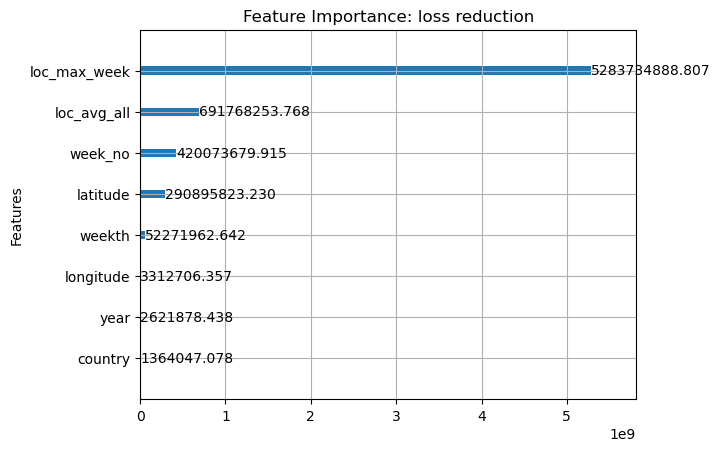

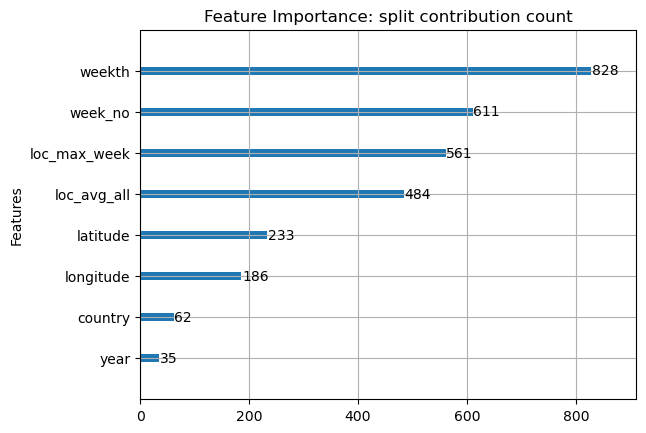

In [76]:
import lightgbm as lgb

lgb.plot_importance(model, importance_type='gain', title='Feature Importance: loss reduction', xlabel='', max_num_features=12)
plt.show

lgb.plot_importance(model, importance_type='split', title='Feature Importance: split contribution count', xlabel='', max_num_features=12)
plt.show

### Compare Actual-Valid.

In [77]:
fts = ['latitude', 'longitude', 'year', 'week_no', 'emission']
cmp = trn[fts]

cmp['pred'] = vld_pred
cmp['diff'] = cmp.pred - cmp.emission
cmp['diff_abs'] = cmp['diff'].abs()
cmp['diff_sq'] = cmp['diff']**2


sq_sum = cmp['diff_sq'].sum()
print(f'sq_sum: {sq_sum:.5f}')

rmse2 = np.sqrt(cmp['diff_sq'].sum() / len(cmp['diff_sq']))
print(f'rmse2: {rmse2:.5f}')

cmp.ratio = cmp['diff_sq'] / sq_sum
print(f'sum of ratio: {cmp.ratio.sum()}')

sq_sum: 14468504.21329
rmse2: 13.53116
sum of ratio: 0.9999999999999997


In [78]:
cmp

,latitude,longitude,year,week_no,emission,pred,diff,diff_abs,diff_sq
0,-0.510,29.290,2019,0,3.750994,3.407441,-0.343553,0.343553,0.118029
1,-0.510,29.290,2019,1,4.025176,3.658094,-0.367082,0.367082,0.134749
2,-0.510,29.290,2019,2,4.231381,4.143691,-0.087690,0.087690,0.007690
3,-0.510,29.290,2019,3,4.305286,4.757031,0.451745,0.451745,0.204074
4,-0.510,29.290,2019,4,4.347317,4.749277,0.401960,0.401960,0.161571
...,...,...,...,...,...,...,...,...,...
79018,-3.299,30.301,2021,48,29.404171,28.177125,-1.227046,1.227046,1.505642
79019,-3.299,30.301,2021,49,29.186497,27.859936,-1.326561,1.326561,1.759764
79020,-3.299,30.301,2021,50,29.131205,28.439604,-0.691601,0.691601,0.478312
79021,-3.299,30.301,2021,51,28.125792,27.991031,-0.134761,0.134761,0.018161


In [79]:
cmp

,latitude,longitude,year,week_no,emission,pred,diff,diff_abs,diff_sq
0,-0.510,29.290,2019,0,3.750994,3.407441,-0.343553,0.343553,0.118029
1,-0.510,29.290,2019,1,4.025176,3.658094,-0.367082,0.367082,0.134749
2,-0.510,29.290,2019,2,4.231381,4.143691,-0.087690,0.087690,0.007690
3,-0.510,29.290,2019,3,4.305286,4.757031,0.451745,0.451745,0.204074
4,-0.510,29.290,2019,4,4.347317,4.749277,0.401960,0.401960,0.161571
...,...,...,...,...,...,...,...,...,...
79018,-3.299,30.301,2021,48,29.404171,28.177125,-1.227046,1.227046,1.505642
79019,-3.299,30.301,2021,49,29.186497,27.859936,-1.326561,1.326561,1.759764
79020,-3.299,30.301,2021,50,29.131205,28.439604,-0.691601,0.691601,0.478312
79021,-3.299,30.301,2021,51,28.125792,27.991031,-0.134761,0.134761,0.018161


In [80]:
df = cmp.groupby(['latitude', 'longitude']).diff_sq.sum().reset_index()
df

,latitude,longitude,diff_sq
0,-3.299,30.301,243.238474
1,-3.287,29.713,645.661339
2,-3.174,29.926,253.968237
3,-3.161,28.839,47.191196
4,-3.153,30.347,399.297093
...,...,...,...
492,-0.598,29.102,39.334565
493,-0.569,30.031,3003.288310
494,-0.547,29.653,23.136656
495,-0.528,29.472,53.717691


In [84]:
ss = df.diff_sq.sum()
print(ss)
df['ratio_diff_sq'] = df.diff_sq / ss
df.sort_values(by = 'diff_sq')

14468504.213289814


,latitude,longitude,diff_sq,ratio_diff_sq
421,-1.076,28.724,1.546964e+01,0.000001
382,-1.252,28.848,1.867352e+01,0.000001
251,-1.877,28.523,1.873360e+01,0.000001
310,-1.583,28.517,1.908606e+01,0.000001
484,-0.677,29.623,2.066361e+01,0.000001
...,...,...,...,...
127,-2.441,28.959,8.410816e+04,0.005813
105,-2.599,29.801,9.023640e+04,0.006237
326,-1.514,29.686,1.403366e+05,0.009699
139,-2.378,29.222,1.450812e+06,0.100274


In [82]:
df.ratio_diff_sq.sum()

1.0

### 2 Special Locations

In [ ]:
# cmp['year_week'] = pd.to_datetime((cmp.year * 100 + cmp.week_no).astype('str') + '0', format='%Y%W%w')
# cmp1 = cmp[(cmp.latitude==-2.378) & (cmp.longitude==29.222)]
# cmp2 = cmp[(cmp.latitude==-2.079) & (cmp.longitude==29.321)]

# cmp1

In [ ]:
# plt.figure(figsize = (10, 5))
# plt.title('Emission over Time')
# sns.lineplot(x=year_week, y='emission', data=cmp1, label='actual')
# sns.lineplot(x=year_week, y='pred', data=cmp1, label='pred')

# plt.show()

In [ ]:
# cmp1.sort_values(by='diff_abs').tail(10)

In [ ]:
# plt.figure(figsize = (10, 5))
# plt.title('Emission over Time')
# sns.lineplot(x=year_week, y='emission', data=cmp2, label='actual')
# sns.lineplot(x=year_week, y='pred', data=cmp2, label='pred')

# plt.show()

In [ ]:
# cmp2.sort_values(by='diff_abs').tail(10)

## 추가